# Data Set: Wine Quality

[Link to the data](https://archive.ics.uci.edu/ml/datasets/wine+quality)

Author: Sayedeh Hussaini

Lecturer: Elizabeth Staegemann

## Load the Libraries

In [98]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

## Load the Data Set

In [99]:
# loading the data
df = pd.read_csv('winequality-red.csv', delimiter=';')


# looking at the first 10 rows
df.head(10)
print(f"number of rows is {df.shape[0]} and columns is df: {df.shape[1]}")

number of rows is 1599 and columns is df: 12


## Data Type and Memory Usage

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


## Check the NaN Values

In [101]:
# the number of NaN values in each columns
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

## Distribution of Data Set Respect to our Target Column

In [102]:
# counting the values of the target column
CategoryCount = df["quality"].value_counts().reset_index()

# assigning new labels to the columns
CategoryCount.columns = ["Category", "Count"]

fig = px.pie(CategoryCount, names="Category", values="Count", title="Distribution of the Quality")
fig.update_traces(textfont_size=25)
fig.show()

## Catogorizing the Target Column

In [103]:
# catogorizing the target column 
condition = [(df["quality"] == 3) | (df["quality"] == 4),
             (df["quality"] == 5) | (df["quality"] == 6),
             (df["quality"] == 7) | (df["quality"] == 8)]

categories = ["Poor", "Acceptable", "Good"]

df["QualityCategory"] = np.select(condition, categories, default="Unknown")

## Pie Chart of our Catogorized Target Column 

In [104]:

CategoryCount = df["QualityCategory"].value_counts() # this returns a Pandas series
DataFrame = CategoryCount.reset_index() # this returns the series to a dataframe

# change the name of the columns in our dataframe
DataFrame.columns = ["Category", "Count"]

fig = px.pie(DataFrame, names="Category", values="Count", title="Distribution of the Quality")
fig.update_traces(textfont_size=25)
fig.show()

## Removing the Target Column

In [105]:
# loading the original data set again to make this cell independen
df = pd.read_csv('winequality-red.csv', delimiter=';')

# We remove the target column: quality from the data set
dfNoTarget = df.drop(["quality"], axis=1)
dfNoTarget.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


## Check Duplication in the Data Set

In [106]:
# check whether the duplication
df.duplicated()

# sum of all duplicated rows
print(f'the number of duplicated rows {df.duplicated().sum()}')

# calculating the percentage of duplicated data
duplicatedPerc = round((df.duplicated().sum()/df.shape[0])*100, 2)
print(f'{duplicatedPerc} percentage of the data is duplicated')
df.head()

the number of duplicated rows 240
15.01 percentage of the data is duplicated


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


### Visualisation of the Duplicated Values

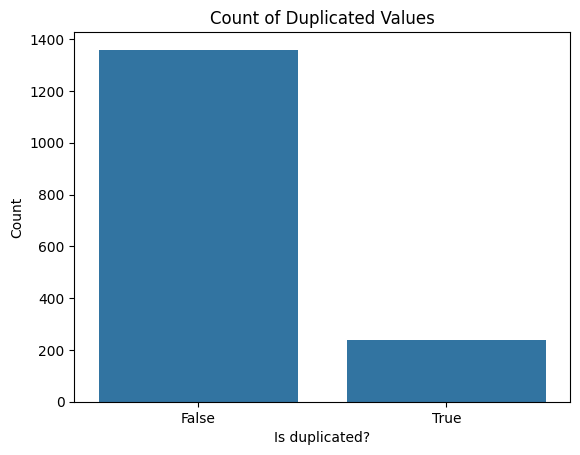

In [129]:
# assigning our data set (with duplicated data) to a new variable 
dfWithDuplicated = dfNoTarget

# Mark duplicated rows: to this we create a new column named "is_duplicate"
dfWithDuplicated['is_duplicate'] = dfWithDuplicated.duplicated()


sns.countplot(x=dfWithDuplicated['is_duplicate'])
plt.title("Count of Duplicated Values")
plt.xlabel("Is duplicated?")
plt.ylabel("Count")
plt.show()

## Remove the "is_duplicated" column

In [130]:
dfWithDuplicated.drop(["is_duplicate"], axis=1, inplace=True)

## Removing the Duplicated Data

In [131]:
dfNoDuplicated = dfWithDuplicated.drop_duplicates().copy()

In [132]:
print(f"number of updated rows is {dfNoDuplicated.shape[0]} and columns is df: {dfNoDuplicated.shape[1]}")

number of updated rows is 1359 and columns is df: 11


## Statistical Summary

### With Duplicated Data

In [111]:
dfWithDuplicated.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000


### Without Duplicated Data 

In [112]:
dfNoDuplicated.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000


## Outliers Visualisation

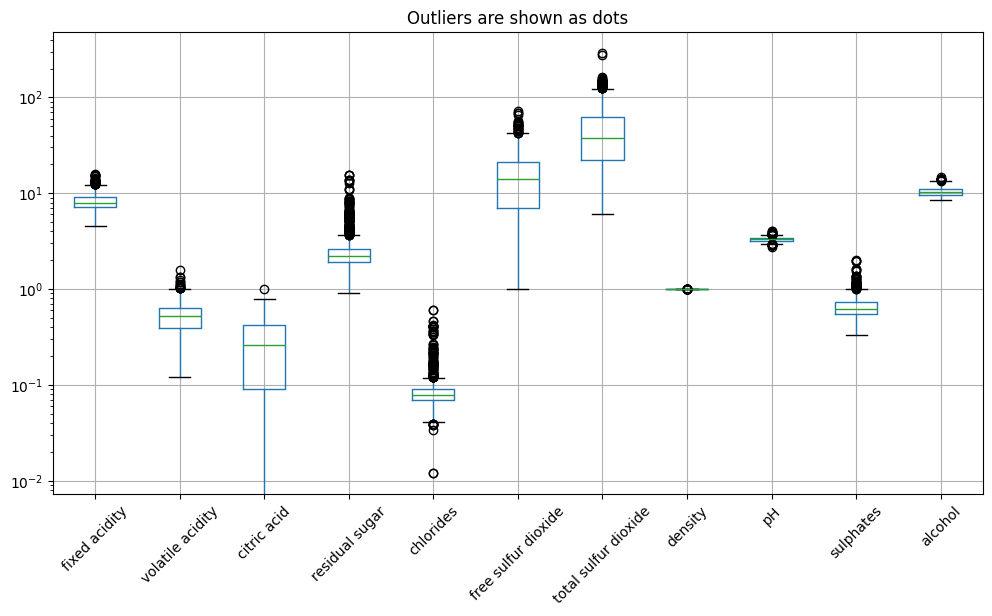

In [113]:
# We make a list of the columns with float and int data type
NumericCols = dfNoDuplicated.select_dtypes(include=['float64', 'int64']).columns

# Plot boxplots for all numeric columns
plt.figure(figsize=(12, 6))
df[NumericCols].boxplot(rot=45)
plt.yscale("log")
plt.title("Outliers are shown as dots")
plt.show()

## Correlation Between the Features

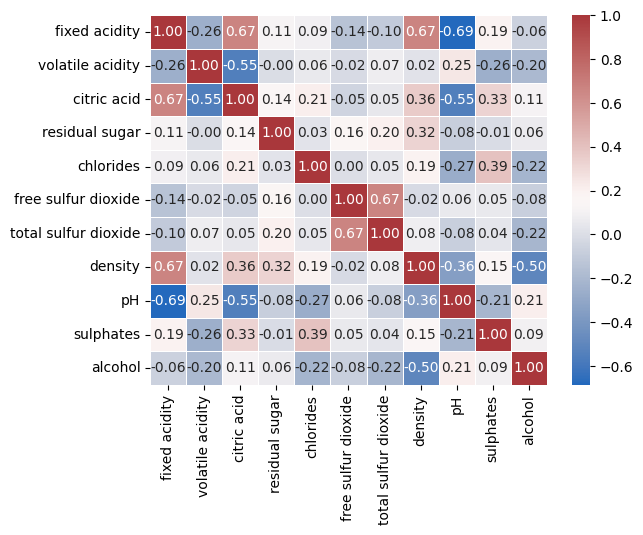

In [114]:
correlationMatrix = dfNoDuplicated.corr()
#print(correlationMatrix)

sns.heatmap(correlationMatrix, annot=True, cmap='vlag', fmt=".2f", linewidths=0.5)
plt.savefig('correlationmatrix.png')
plt.show()

### Visualization the Correlation betweent the Features

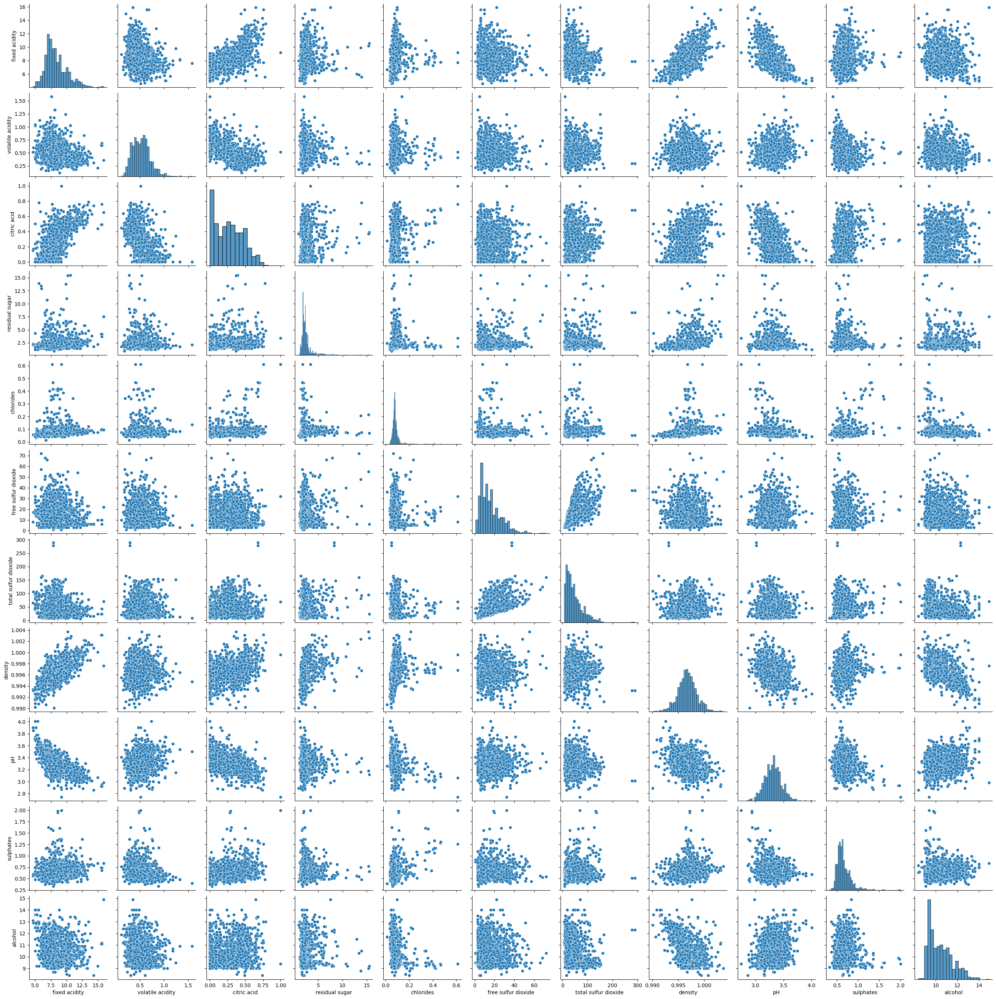

In [115]:
sns.pairplot(data=dfNoDuplicated) #=df[df["quality"] == 5]

## Multicollinearity: Feature Engineering (Combining Features)

In [116]:
# important: we need to do all the following editing to our data after scaling

dfNoDuplicated["SugarFraction"] = dfNoDuplicated["residual sugar"] /dfNoDuplicated["density"]
dfNoDuplicated["Sulfur"] = dfNoDuplicated["free sulfur dioxide"] / dfNoDuplicated["total sulfur dioxide"]
dfNoDuplicated["Acidity"] = dfNoDuplicated["fixed acidity"] / dfNoDuplicated["pH"]

dfNoDuplicated.drop(columns=["free sulfur dioxide", "total sulfur dioxide"], inplace=True)
dfNoDuplicated.drop(columns=["residual sugar"], inplace=True)
dfNoDuplicated.drop(columns=["fixed acidity"], inplace=True)

#df = df.drop(["quality"], axis=1)
dfNoDuplicated.head()

,volatile acidity,citric acid,chlorides,density,pH,sulphates,alcohol,SugarFraction,Sulfur,Acidity
0,0.70,0.00,0.076,0.9978,3.51,0.56,9.4,1.904189,0.323529,2.108262
1,0.88,0.00,0.098,0.9968,3.20,0.68,9.8,2.608347,0.373134,2.437500
2,0.76,0.04,0.092,0.9970,3.26,0.65,9.8,2.306921,0.277778,2.392638
3,0.28,0.56,0.075,0.9980,3.16,0.58,9.8,1.903808,0.283333,3.544304
5,0.66,0.00,0.075,0.9978,3.51,0.56,9.4,1.803969,0.325000,2.108262


In [117]:
dfNoDuplicated.describe()

,volatile acidity,citric acid,chlorides,density,pH,sulphates,alcohol,SugarFraction,Sulfur,Acidity
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,0.529478,0.272333,0.088124,0.996709,3.309787,0.658705,10.432315,2.530917,0.381488,2.533349
std,0.183031,0.195537,0.049377,0.001869,0.155036,0.170667,1.082065,1.352913,0.154527,0.623088
min,0.120000,0.000000,0.012000,0.990070,2.740000,0.330000,8.400000,0.909027,0.022727,1.179487
25%,0.390000,0.090000,0.070000,0.995600,3.210000,0.550000,9.500000,1.906147,0.260252,2.092357
50%,0.520000,0.260000,0.079000,0.996700,3.310000,0.620000,10.200000,2.207483,0.375000,2.407407
75%,0.640000,0.430000,0.091000,0.997820,3.400000,0.730000,11.100000,2.605994,0.484360,2.861635
max,1.580000,1.000000,0.611000,1.003690,4.010000,2.000000,14.900000,15.459805,0.857143,5.342466


## Outliers Visualisation after Normalisation

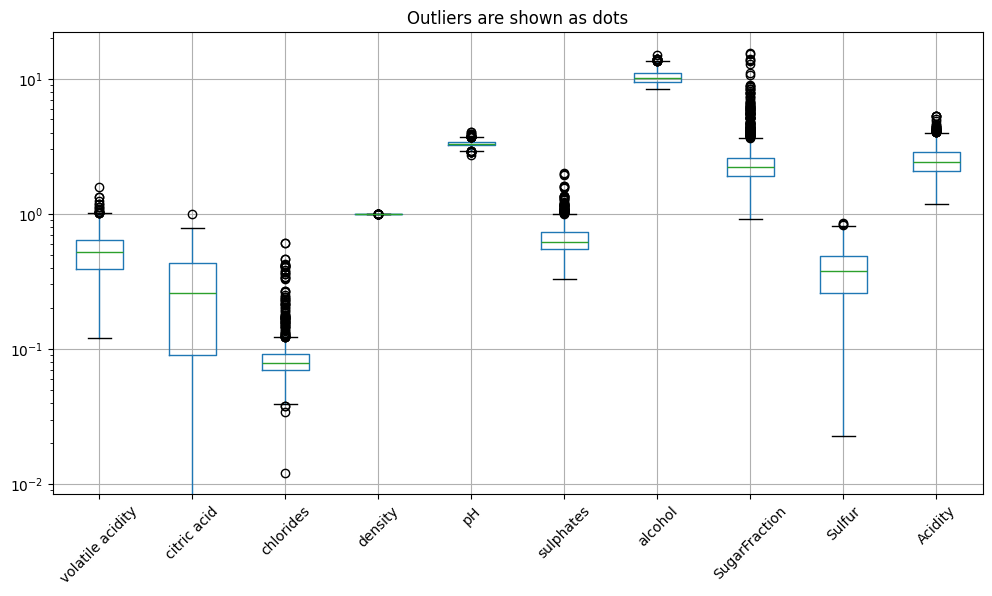

In [118]:
numeric_cols = dfNoDuplicated.select_dtypes(include=['float64', 'int64']).columns

# Plot boxplots for all numeric columns
plt.figure(figsize=(12, 6))
dfNoDuplicated[numeric_cols].boxplot(rot=45)
plt.yscale("log")
plt.title("Outliers are shown as dots")
plt.show()

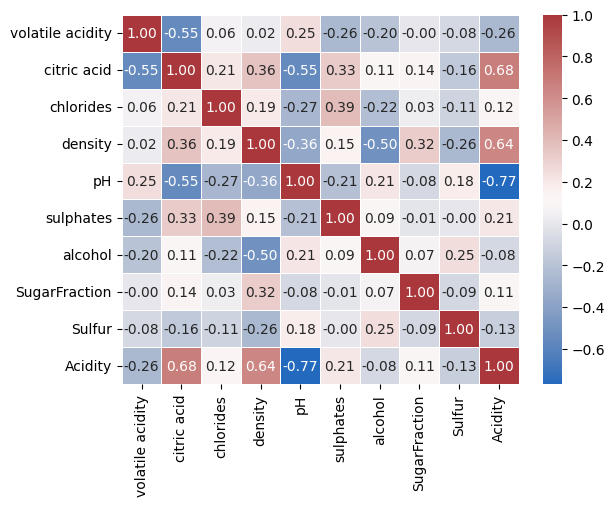

In [119]:
correlationMatrix = dfNoDuplicated.corr()
#print(correlationMatrix)

sns.heatmap(correlationMatrix, annot=True, cmap='vlag', fmt=".2f", linewidths=0.5)
#plt.layout()
plt.savefig('correlationmatrix.png')
plt.show()

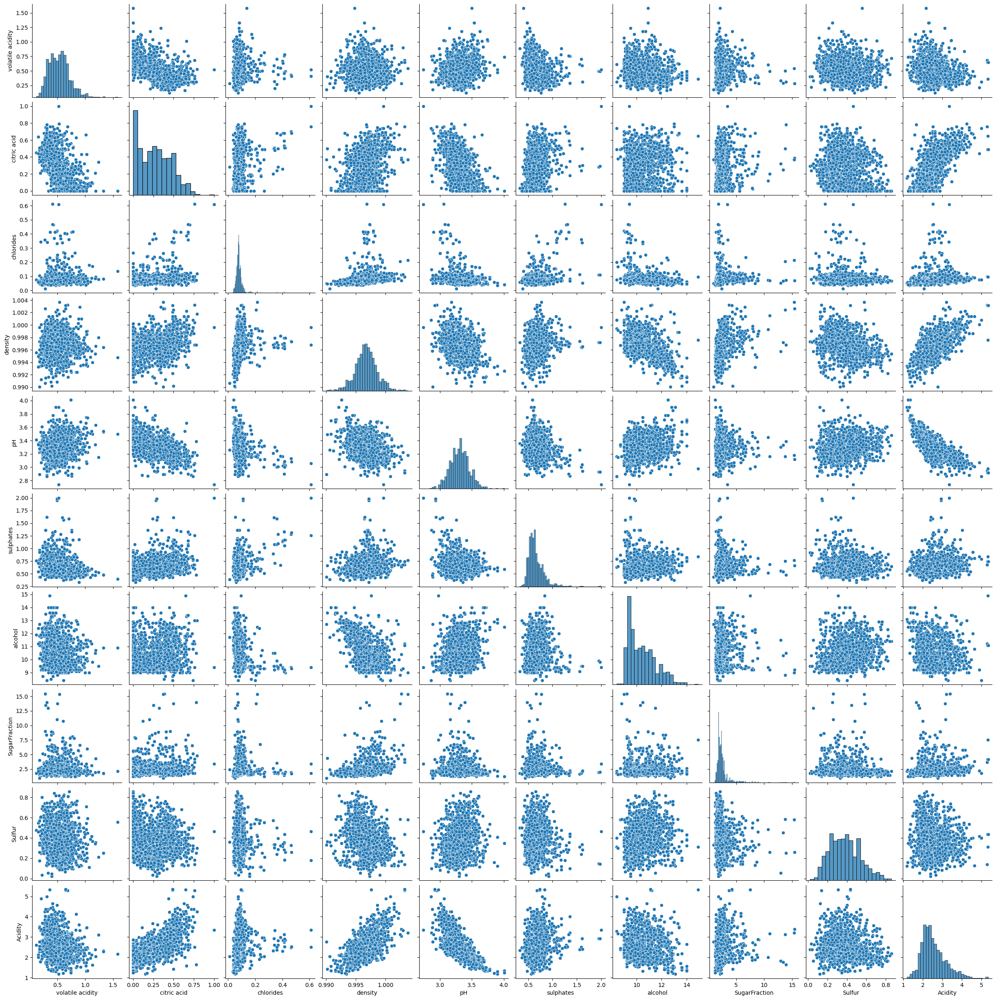

In [120]:
sns.pairplot(data=dfNoDuplicated)
plt.savefig("correlation-pairplot.png")

In [121]:
dfOriginal = pd.read_csv("winequality-red.csv", delimiter=";")
print(np.shape(dfOriginal))
dfNoDuplicate = dfOriginal.drop_duplicates()
print(np.shape(dfNoDuplicate))
dfNoDuplicate.to_csv("DatasetNoDuplicate.csv", index=False)

(1599, 12)
(1359, 12)


In [122]:
df = pd.read_csv('DatasetNoDuplicate.csv', delimiter=',')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


## Stratify Our Data Set

In [123]:
from sklearn.model_selection import StratifiedShuffleSplit

Dataset = np.loadtxt('DatasetNoDuplicate.csv', delimiter=',', skiprows=1)


X = Dataset[:, :-1]
y = Dataset[:, -1]
print(np.shape(X))
# here we have an iterator
StratifiedData = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# split() function create indices which we need to iterate to have our splitted data set
# Extracting train-test indices from the iterator
for train_idx, test_idx in StratifiedData.split(X, y):
    #print(train_idx, test_idx)
    XTrain, XTest = X[train_idx], X[test_idx]
    yTrain, yTest = y[train_idx], y[test_idx]

print(len(yTrain))
print("...................")
print(len(yTest))

(1359, 11)
1087
...................
272


## Scaling and Spliting Our Data Set

## Scaling Our Test and Training Data

In [124]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


#ataset = np.loadtxt('DatasetNoDuplicate.csv', delimiter=',', skiprows=1)


#X = Dataset[:, :-1]
#y = Dataset[:, -1]

#XTrain, XTest, yTrain, yTest = train_test_split(X, y, test_size=0.2, random_state=42)
"""
scaler = StandardScaler()

XTrain = scaler.fit_transform(XTrain)
XTest = scaler.transform(XTest)

# converting the numpy format to the pandas series
dfXTrain = pd.DataFrame(XTrain)
dfXTest = pd.DataFrame(XTest)
dfyTrain = pd.DataFrame(yTrain)
dfyTest = pd.DataFrame(yTest)

# saving our data to csv format
dfXTrain.to_csv("ScaledXTrain.csv", index=False)
dfXTest.to_csv("ScaledXTest.csv", index=False)
dfyTrain.to_csv("yTrain.csv", index=False)
dfyTest.to_csv("yTest.csv", index=False)
"""

In [125]:
print(yTrain)

[6. 6. 7. ... 4. 5. 6.]


In [126]:
# list of the column names in our original dataframe
ColumnNames = df.columns.tolist()

dfXTrain = pd.read_csv("ScaledXTrain.csv")
dfXTest = pd.read_csv("ScaledXTest.csv")

# naming the columns in our training set
dfXTrain.columns = ColumnNames[:-1]

# naming the columns in our test set
dfXTest.columns = ColumnNames[:-1]

dfXTrain.head()



,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.631638,-0.172462,-0.472778,-0.321789,-0.342364,-0.377365,-0.475851,0.471781,1.331499,0.377601,-0.769571
1,-0.743460,0.258557,0.036144,1.683774,-0.048390,-0.377365,0.631470,-0.195113,0.071902,0.259621,0.507402
2,0.095209,-1.357767,1.461127,-0.544630,0.098596,1.790243,1.622230,0.101863,-0.054057,0.554571,0.051340
3,-0.687549,-0.064707,-1.236162,0.049611,-0.237373,0.470829,1.301690,0.388419,1.205539,-0.330279,-0.587147
4,-0.687549,0.420190,-1.287054,-0.024669,-0.132383,0.093854,1.155990,0.388419,1.079579,-0.330279,-0.678359


## Adding and Removing Features in our Training Dataset

In [127]:
dfXTrain["SugarFraction"] = dfXTrain["residual sugar"] /dfXTrain["density"]
dfXTrain["Sulfur"] = dfXTrain["free sulfur dioxide"] / dfXTrain["total sulfur dioxide"]
dfXTrain["Acidity"] = dfXTrain["fixed acidity"] / dfXTrain["pH"]

dfXTrain.drop(columns=["free sulfur dioxide", "total sulfur dioxide"], inplace=True)
dfXTrain.drop(columns=["residual sugar"], inplace=True)
dfXTrain.drop(columns=["fixed acidity"], inplace=True)

dfXTrain.to_csv("NormalizedScaledXTrain.csv", index=False)
dfXTrain.head()

,volatile acidity,citric acid,chlorides,density,pH,sulphates,alcohol,SugarFraction,Sulfur,Acidity
0,-0.172462,-0.472778,-0.342364,0.471781,1.331499,0.377601,-0.769571,-0.682074,0.793033,-0.474381
1,0.258557,0.036144,-0.048390,-0.195113,0.071902,0.259621,0.507402,-8.629735,-0.597599,-10.339850
2,-1.357767,1.461127,0.098596,0.101863,-0.054057,0.554571,0.051340,-5.346682,1.103569,-1.761257
3,-0.064707,-1.236162,-0.237373,0.388419,1.205539,-0.330279,-0.587147,0.127726,0.361706,-0.570325
4,0.420190,-1.287054,-0.132383,0.388419,1.079579,-0.330279,-0.678359,-0.063511,0.081189,-0.636868


## Adding and Removing Features in our Test Dataset

In [128]:
dfXTest["SugarFraction"] = dfXTest["residual sugar"] /dfXTest["density"]
dfXTest["Sulfur"] = dfXTest["free sulfur dioxide"] / dfXTest["total sulfur dioxide"]
dfXTest["Acidity"] = dfXTest["fixed acidity"] / dfXTest["pH"]

dfXTest.drop(columns=["free sulfur dioxide", "total sulfur dioxide"], inplace=True)
dfXTest.drop(columns=["residual sugar"], inplace=True)
dfXTest.drop(columns=["fixed acidity"], inplace=True)

dfXTest.head()

dfXTest.to_csv("StandardScaledXTest.csv", index=False)